In [1]:
#!/usr/bin/env python
__author__ = "Sreenivas Bhattiprolu"
__license__ = "Feel free to copy, I appreciate if you acknowledge Python for Microscopists"

# https://youtu.be/bIaT2X5Hd5k



"""

Image colorization using Autoencoders. Transfer learning using VGG.

"""

from keras.layers import Conv2D, UpSampling2D, Input
from keras.models import Sequential, Model
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import img_to_array, load_img
from skimage.color import rgb2lab, lab2rgb, gray2rgb
from skimage.transform import resize
from skimage.io import imsave
import numpy as np
import tensorflow as tf
import keras
import os

"""
Because we are going to replace the encoder part with VGG16, 
we don’t need it as a classifier, we need it as a feature extractor so, 
the last dense layers isn’t needed we have to pop them up.

here, we iterate on each layer except the last dense layers so, 
we add 19 layer to our model. the dimension of last layer volume is “7x7x512”. 
we will be using that latent space volume as a feature vector to be input to the decoder.
 and the decoder is going to learn the mapping from the latent space vector to ab channels. 
 we want the layers of VGG16 with its original weights without changing them, 
 so that we set the trainable parameter in each layer to false because we don’t want to train them again.
"""
from keras.applications.vgg19 import VGG19
vggmodel = VGG19()



2023-03-07 20:56:14.898690: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-07 20:56:17.536264: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
vggmodel.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [2]:
import cv2
from tqdm import tqdm 
import re
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)


# defining the size of image 
SIZE = 224

image_path = 'CUHK Dataset/CUHK_training_cropped_photos'
img_array = []

sketch_path = 'CUHK Dataset/CUHK_training_cropped_sketches'
sketch_array = []

image_file = sorted_alphanumeric(os.listdir(image_path))
sketch_file = sorted_alphanumeric(os.listdir(sketch_path))

image_test_path = 'CUHK Dataset/CUHK_testing_cropped_photos'
image_test_file = sorted_alphanumeric(os.listdir(image_test_path))
img_test_array = []

for i in tqdm(image_file):
    image = cv2.imread(image_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    image = cv2.resize(image, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    
    #appending normal normal image    
    img_array.append(img_to_array(image))
    # Image Augmentation
    
    # horizontal flip 
    img1 = cv2.flip(image,1)
    img_array.append(img_to_array(img1))
     #vertical flip 
    img2 = cv2.flip(image,-1)
    img_array.append(img_to_array(img2))
     #vertical flip 
    img3 = cv2.flip(image,-1)
    # horizontal flip
    img3 = cv2.flip(img3,1)
    img_array.append(img_to_array(img3))
    # rotate clockwise 
    img4 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    img_array.append(img_to_array(img4))
    # flip rotated image 
    img5 = cv2.flip(img4,1)
    img_array.append(img_to_array(img5))
     # rotate anti clockwise 
    img6 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    img_array.append(img_to_array(img6))
    # flip rotated image 
    img7 = cv2.flip(img6,1)
    img_array.append(img_to_array(img7))
  
    
for i in tqdm(sketch_file):
    image = cv2.imread(sketch_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    image = cv2.resize(image, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    # appending normal sketch image
    sketch_array.append(img_to_array(image))
    
    #Image Augmentation
    # horizontal flip 
    img1 = cv2.flip(image,1)
    sketch_array.append(img_to_array(img1))
     #vertical flip 
    img2 = cv2.flip(image,-1)
    sketch_array.append(img_to_array(img2))
     #vertical flip 
    img3 = cv2.flip(image,-1)
    # horizontal flip
    img3 = cv2.flip(img3,1)
    sketch_array.append(img_to_array(img3))
    # rotate clockwise 
    img4 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    sketch_array.append(img_to_array(img4))
    # flip rotated image 
    img5 = cv2.flip(img4,1)
    sketch_array.append(img_to_array(img5))
     # rotate anti clockwise 
    img6 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    sketch_array.append(img_to_array(img6))
    # flip rotated image 
    img7 = cv2.flip(img6,1)
    sketch_array.append(img_to_array(img7))
    
print("Total number of sketch images:",len(sketch_array))
print("Total number of images:",len(img_array))

train_sketch = sketch_array
train_image = img_array

for i in tqdm(image_test_file):
    image = cv2.imread(image_test_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    image = cv2.resize(image, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    
    #appending normal normal image    
    img_test_array.append(img_to_array(image))
    # Image Augmentation

test_image = img_test_array

sketch_test_path = 'CUHK Dataset/CUHK_testing_cropped_sketches'
sketch_test_file = sorted_alphanumeric(os.listdir(sketch_test_path))
sketch_test_array = []

for i in tqdm(sketch_test_file):
    image = cv2.imread(sketch_test_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # resizing images 
    image = cv2.resize(image, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    
    #appending normal normal image    
    sketch_test_array.append(img_to_array(image))
    # Image Augmentation

test_sketch = sketch_test_array

100%|██████████| 88/88 [00:00<00:00, 478.66it/s]


Total number of sketch images: 704
Total number of images: 704


100%|██████████| 100/100 [00:00<00:00, 1224.83it/s]


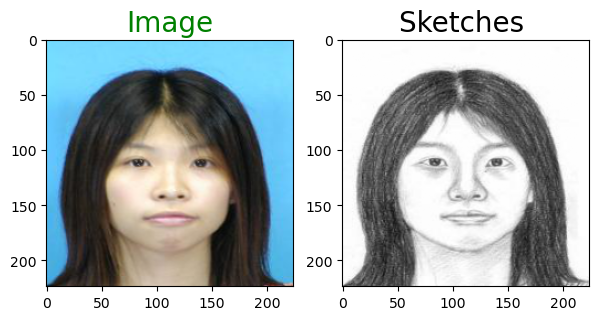

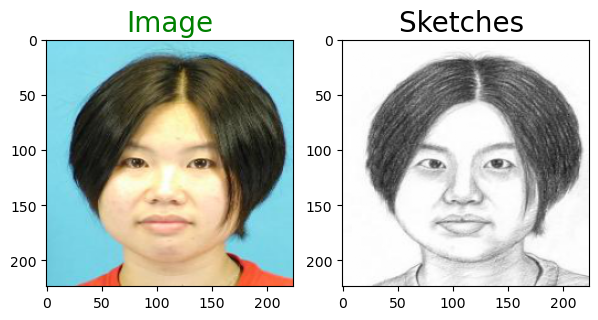

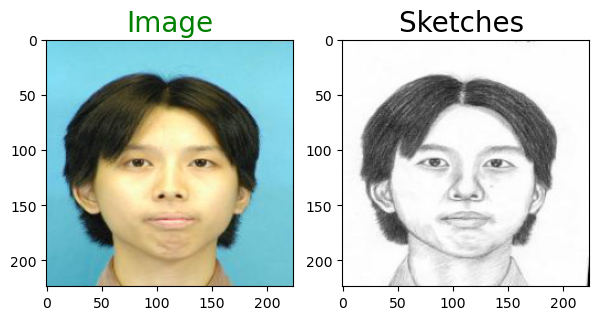

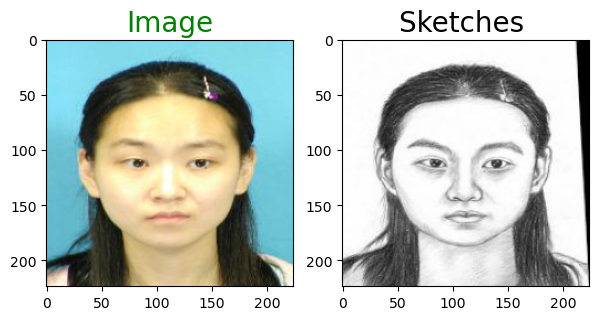

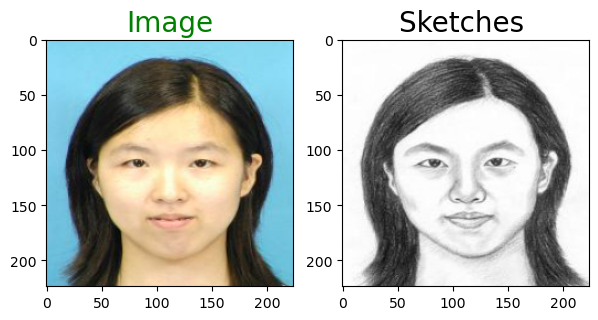

...

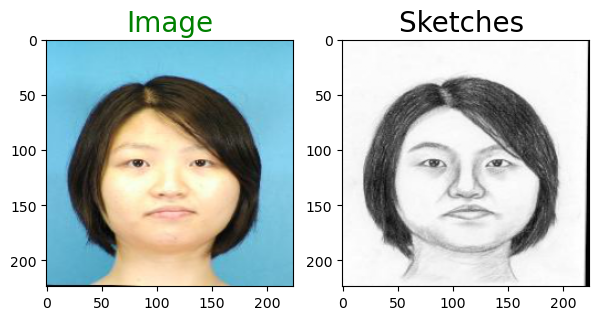

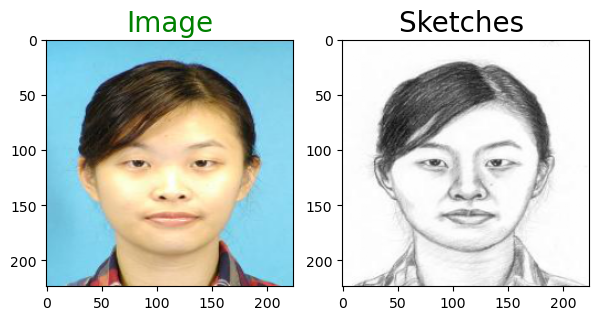

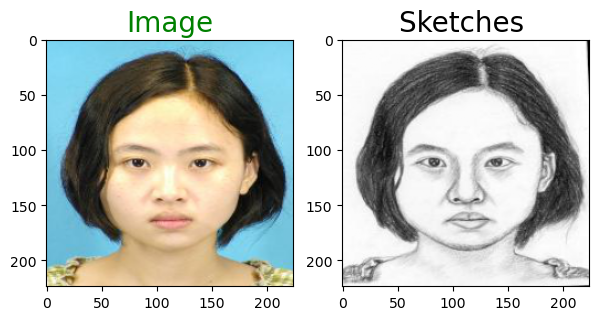

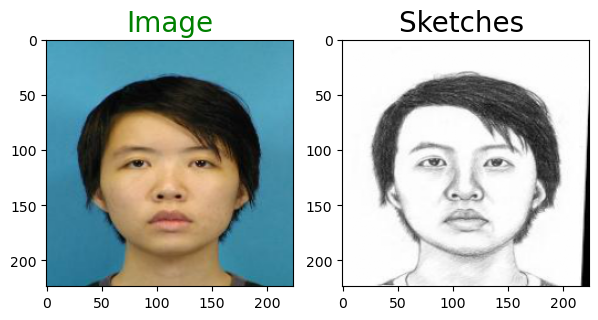

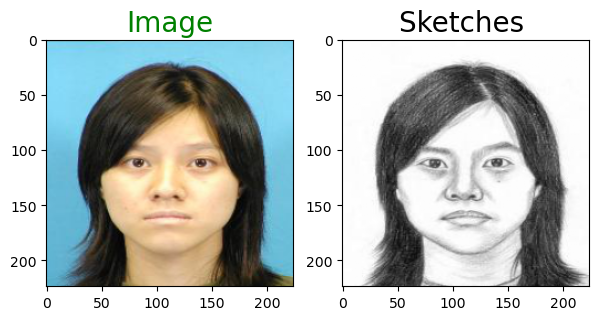

In [3]:
import matplotlib.pyplot as plt
# defining function to plot images pair
def plot_images(image, sketches):
    plt.figure(figsize=(7,7))
    plt.subplot(1,2,1)
    plt.title('Image', color = 'green', fontsize = 20)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.title('Sketches ', color = 'black', fontsize = 20)
    plt.imshow(sketches)
   
    plt.show()

ls = [i for i in range(0,104,8)]
for i in ls:
    plot_images(img_array[i],sketch_array[i])

In [4]:
newmodel = Sequential()
#num = 0
for i, layer in enumerate(vggmodel.layers):
    if i<22:          #Only up to 22nd layer to include feature extraction only
      newmodel.add(layer)
newmodel.summary()
for layer in newmodel.layers:
  layer.trainable=False   #We don't want to train these layers again, so False. 

"""
VGG16 is expecting an image of 3 dimension with size 224x224 as an input, 
in preprocessing we have to scale all images to 224 instead of 256
"""
path = 'CUHK Dataset/CUHK_training_cropped_photos'



#Convert from RGB to Lab
"""
by iterating on each image, we convert the RGB to Lab. 
Think of LAB image as a grey image in L channel and all color info stored in A and B channels. 
The input to the network will be the L channel, so we assign L channel to X vector. 
And assign A and B to Y.
"""
print(len(train_image)) 

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

In [6]:
newmodel.save("vgg19_pretrained.model")

INFO:tensorflow:Assets written to: vgg19_pretrained.model/assets


INFO:tensorflow:Assets written to: vgg19_pretrained.model/assets


In [6]:
vggfeatures = []
for i in range(len(sketch_array)):
  sample = sketch_array[i]
  sample = sample.reshape((1,224,224,3))
  prediction = newmodel.predict(sample)
  prediction = prediction.reshape((7,7,512))
  vggfeatures.append(prediction)
vggfeatures = np.array(vggfeatures)
print(vggfeatures.shape)






1/1 [==============================] - 0s 185ms/step
(704, 7, 7, 512)


In [7]:
Y = np.array(img_array)

In [10]:
#Decoder
model = Sequential()

model.add(Conv2D(256, (3,3), activation='relu', padding='same', input_shape=(7,7,512)))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
#changed to 3
model.add(Conv2D(3, (3, 3), activation='tanh', padding='same'))
model.add(UpSampling2D((2, 2)))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 7, 7, 256)         1179904   
                                                                 
 conv2d_7 (Conv2D)           (None, 7, 7, 128)         295040    
                                                                 
 up_sampling2d_5 (UpSampling  (None, 14, 14, 128)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 14, 14, 64)        73792     
                                                                 
 up_sampling2d_6 (UpSampling  (None, 28, 28, 64)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 28, 28, 32)       

Epoch 1/10000
5/5 [==============================] - 4s 715ms/step - loss: 0.3296 - accuracy: 0.5506 - val_loss: 0.1176 - val_accuracy: 0.5748
Epoch 2/10000
5/5 [==============================] - 3s 696ms/step - loss: 0.1445 - accuracy: 0.2074 - val_loss: 0.1438 - val_accuracy: 0.0605
Epoch 3/10000
5/5 [==============================] - 4s 715ms/step - loss: 0.1553 - accuracy: 0.1039 - val_loss: 0.1044 - val_accuracy: 0.1537
Epoch 4/10000
5/5 [==============================] - 3s 690ms/step - loss: 0.1186 - accuracy: 0.2073 - val_loss: 0.0866 - val_accuracy: 0.3661
Epoch 5/10000
5/5 [==============================] - 4s 712ms/step - loss: 0.0829 - accuracy: 0.3783 - val_loss: 0.0705 - val_accuracy: 0.3865
Epoch 6/10000
5/5 [==============================] - 4s 694ms/step - loss: 0.0677 - accuracy: 0.5782 - val_loss: 0.0615 - val_accuracy: 0.7586
Epoch 7/10000
5/5 [==============================] - 3s 692ms/step - loss: 0.0580 - accuracy: 0.7651 - val_loss: 0.0526 - val_accuracy: 0.7744

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_01000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_01000.model/assets


5/5 [==============================] - 4s 890ms/step - loss: 0.0040 - accuracy: 0.9200 - val_loss: 0.0227 - val_accuracy: 0.9006
Epoch 1001/10000
5/5 [==============================] - 4s 711ms/step - loss: 0.0039 - accuracy: 0.9195 - val_loss: 0.0226 - val_accuracy: 0.9024
Epoch 1002/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0038 - accuracy: 0.9202 - val_loss: 0.0227 - val_accuracy: 0.9000
Epoch 1003/10000
5/5 [==============================] - 3s 700ms/step - loss: 0.0038 - accuracy: 0.9198 - val_loss: 0.0228 - val_accuracy: 0.8997
Epoch 1004/10000
5/5 [==============================] - 3s 699ms/step - loss: 0.0039 - accuracy: 0.9202 - val_loss: 0.0225 - val_accuracy: 0.9020
Epoch 1005/10000
5/5 [==============================] - 4s 728ms/step - loss: 0.0037 - accuracy: 0.9209 - val_loss: 0.0225 - val_accuracy: 0.9000
Epoch 1006/10000
5/5 [==============================] - 3s 696ms/step - loss: 0.0037 - accuracy: 0.9207 - val_loss: 0.0226 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_02000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_02000.model/assets


5/5 [==============================] - 4s 872ms/step - loss: 0.0028 - accuracy: 0.9253 - val_loss: 0.0241 - val_accuracy: 0.8984
Epoch 2001/10000
5/5 [==============================] - 4s 704ms/step - loss: 0.0027 - accuracy: 0.9249 - val_loss: 0.0241 - val_accuracy: 0.8976
Epoch 2002/10000
5/5 [==============================] - 3s 699ms/step - loss: 0.0028 - accuracy: 0.9246 - val_loss: 0.0239 - val_accuracy: 0.8991
Epoch 2003/10000
5/5 [==============================] - 4s 714ms/step - loss: 0.0031 - accuracy: 0.9241 - val_loss: 0.0241 - val_accuracy: 0.8961
Epoch 2004/10000
5/5 [==============================] - 3s 700ms/step - loss: 0.0034 - accuracy: 0.9244 - val_loss: 0.0237 - val_accuracy: 0.8990
Epoch 2005/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0032 - accuracy: 0.9231 - val_loss: 0.0236 - val_accuracy: 0.8989
Epoch 2006/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0030 - accuracy: 0.9243 - val_loss: 0.0237 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_03000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_03000.model/assets


5/5 [==============================] - 4s 929ms/step - loss: 0.0024 - accuracy: 0.9298 - val_loss: 0.0240 - val_accuracy: 0.9021
Epoch 3001/10000
5/5 [==============================] - 3s 697ms/step - loss: 0.0024 - accuracy: 0.9305 - val_loss: 0.0238 - val_accuracy: 0.9024
Epoch 3002/10000
5/5 [==============================] - 3s 699ms/step - loss: 0.0024 - accuracy: 0.9293 - val_loss: 0.0238 - val_accuracy: 0.9008
Epoch 3003/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0023 - accuracy: 0.9289 - val_loss: 0.0237 - val_accuracy: 0.9006
Epoch 3004/10000
5/5 [==============================] - 3s 706ms/step - loss: 0.0023 - accuracy: 0.9294 - val_loss: 0.0238 - val_accuracy: 0.9026
Epoch 3005/10000
5/5 [==============================] - 4s 718ms/step - loss: 0.0023 - accuracy: 0.9298 - val_loss: 0.0240 - val_accuracy: 0.9007
Epoch 3006/10000
5/5 [==============================] - 3s 696ms/step - loss: 0.0023 - accuracy: 0.9299 - val_loss: 0.0241 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_04000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_04000.model/assets


5/5 [==============================] - 4s 882ms/step - loss: 0.0021 - accuracy: 0.9301 - val_loss: 0.0243 - val_accuracy: 0.9016
Epoch 4001/10000
5/5 [==============================] - 4s 719ms/step - loss: 0.0022 - accuracy: 0.9305 - val_loss: 0.0246 - val_accuracy: 0.9010
Epoch 4002/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0021 - accuracy: 0.9305 - val_loss: 0.0246 - val_accuracy: 0.8999
Epoch 4003/10000
5/5 [==============================] - 3s 699ms/step - loss: 0.0022 - accuracy: 0.9300 - val_loss: 0.0244 - val_accuracy: 0.9018
Epoch 4004/10000
5/5 [==============================] - 3s 703ms/step - loss: 0.0024 - accuracy: 0.9301 - val_loss: 0.0250 - val_accuracy: 0.8992
Epoch 4005/10000
5/5 [==============================] - 3s 698ms/step - loss: 0.0024 - accuracy: 0.9305 - val_loss: 0.0248 - val_accuracy: 0.8993
Epoch 4006/10000
5/5 [==============================] - 4s 725ms/step - loss: 0.0024 - accuracy: 0.9297 - val_loss: 0.0246 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_05000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_05000.model/assets


5/5 [==============================] - 4s 884ms/step - loss: 0.0025 - accuracy: 0.9293 - val_loss: 0.0244 - val_accuracy: 0.9016
Epoch 5001/10000
5/5 [==============================] - 3s 704ms/step - loss: 0.0024 - accuracy: 0.9297 - val_loss: 0.0246 - val_accuracy: 0.8997
Epoch 5002/10000
5/5 [==============================] - 3s 697ms/step - loss: 0.0023 - accuracy: 0.9301 - val_loss: 0.0247 - val_accuracy: 0.9003
Epoch 5003/10000
5/5 [==============================] - 3s 699ms/step - loss: 0.0022 - accuracy: 0.9298 - val_loss: 0.0248 - val_accuracy: 0.8997
Epoch 5004/10000
5/5 [==============================] - 4s 725ms/step - loss: 0.0022 - accuracy: 0.9302 - val_loss: 0.0247 - val_accuracy: 0.9013
Epoch 5005/10000
5/5 [==============================] - 4s 702ms/step - loss: 0.0022 - accuracy: 0.9307 - val_loss: 0.0247 - val_accuracy: 0.9025
Epoch 5006/10000
5/5 [==============================] - 3s 697ms/step - loss: 0.0022 - accuracy: 0.9305 - val_loss: 0.0246 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_06000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_06000.model/assets


5/5 [==============================] - 4s 882ms/step - loss: 0.0020 - accuracy: 0.9312 - val_loss: 0.0253 - val_accuracy: 0.8998
Epoch 6001/10000
5/5 [==============================] - 4s 706ms/step - loss: 0.0020 - accuracy: 0.9312 - val_loss: 0.0253 - val_accuracy: 0.8999
Epoch 6002/10000
5/5 [==============================] - 4s 707ms/step - loss: 0.0020 - accuracy: 0.9312 - val_loss: 0.0252 - val_accuracy: 0.9020
Epoch 6003/10000
5/5 [==============================] - 3s 700ms/step - loss: 0.0021 - accuracy: 0.9312 - val_loss: 0.0258 - val_accuracy: 0.8976
Epoch 6004/10000
5/5 [==============================] - 3s 704ms/step - loss: 0.0024 - accuracy: 0.9296 - val_loss: 0.0249 - val_accuracy: 0.9037
Epoch 6005/10000
5/5 [==============================] - 3s 695ms/step - loss: 0.0024 - accuracy: 0.9302 - val_loss: 0.0253 - val_accuracy: 0.9026
Epoch 6006/10000
5/5 [==============================] - 4s 721ms/step - loss: 0.0023 - accuracy: 0.9304 - val_loss: 0.0255 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_07000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_07000.model/assets


5/5 [==============================] - 4s 888ms/step - loss: 0.0021 - accuracy: 0.9314 - val_loss: 0.0253 - val_accuracy: 0.9009
Epoch 7001/10000
5/5 [==============================] - 3s 702ms/step - loss: 0.0020 - accuracy: 0.9308 - val_loss: 0.0252 - val_accuracy: 0.9006
Epoch 7002/10000
5/5 [==============================] - 3s 699ms/step - loss: 0.0020 - accuracy: 0.9313 - val_loss: 0.0253 - val_accuracy: 0.9018
Epoch 7003/10000
5/5 [==============================] - 3s 695ms/step - loss: 0.0020 - accuracy: 0.9314 - val_loss: 0.0252 - val_accuracy: 0.9007
Epoch 7004/10000
5/5 [==============================] - 4s 719ms/step - loss: 0.0020 - accuracy: 0.9314 - val_loss: 0.0253 - val_accuracy: 0.8995
Epoch 7005/10000
5/5 [==============================] - 4s 707ms/step - loss: 0.0020 - accuracy: 0.9311 - val_loss: 0.0254 - val_accuracy: 0.8994
Epoch 7006/10000
5/5 [==============================] - 3s 698ms/step - loss: 0.0020 - accuracy: 0.9316 - val_loss: 0.0253 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_08000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_08000.model/assets


5/5 [==============================] - 4s 918ms/step - loss: 0.0021 - accuracy: 0.9311 - val_loss: 0.0257 - val_accuracy: 0.9005
Epoch 8001/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0021 - accuracy: 0.9310 - val_loss: 0.0257 - val_accuracy: 0.8993
Epoch 8002/10000
5/5 [==============================] - 4s 719ms/step - loss: 0.0020 - accuracy: 0.9306 - val_loss: 0.0257 - val_accuracy: 0.9019
Epoch 8003/10000
5/5 [==============================] - 3s 699ms/step - loss: 0.0021 - accuracy: 0.9318 - val_loss: 0.0257 - val_accuracy: 0.9011
Epoch 8004/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0021 - accuracy: 0.9308 - val_loss: 0.0259 - val_accuracy: 0.8999
Epoch 8005/10000
5/5 [==============================] - 3s 695ms/step - loss: 0.0021 - accuracy: 0.9308 - val_loss: 0.0258 - val_accuracy: 0.8981
Epoch 8006/10000
5/5 [==============================] - 4s 707ms/step - loss: 0.0020 - accuracy: 0.9312 - val_loss: 0.0259 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_09000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_09000.model/assets


5/5 [==============================] - 4s 913ms/step - loss: 0.0020 - accuracy: 0.9315 - val_loss: 0.0260 - val_accuracy: 0.8989
Epoch 9001/10000
5/5 [==============================] - 3s 701ms/step - loss: 0.0020 - accuracy: 0.9320 - val_loss: 0.0260 - val_accuracy: 0.8981
Epoch 9002/10000
5/5 [==============================] - 4s 711ms/step - loss: 0.0020 - accuracy: 0.9308 - val_loss: 0.0260 - val_accuracy: 0.8977
Epoch 9003/10000
5/5 [==============================] - 4s 708ms/step - loss: 0.0020 - accuracy: 0.9313 - val_loss: 0.0259 - val_accuracy: 0.9004
Epoch 9004/10000
5/5 [==============================] - 4s 727ms/step - loss: 0.0020 - accuracy: 0.9319 - val_loss: 0.0261 - val_accuracy: 0.8991
Epoch 9005/10000
5/5 [==============================] - 3s 693ms/step - loss: 0.0020 - accuracy: 0.9313 - val_loss: 0.0261 - val_accuracy: 0.8977
Epoch 9006/10000
5/5 [==============================] - 3s 700ms/step - loss: 0.0020 - accuracy: 0.9312 - val_loss: 0.0259 - val_accuracy: 0.

INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_10000.model/assets


INFO:tensorflow:Assets written to: vgg19_dropout_test_models/VGG19_10000.model/assets


5/5 [==============================] - 4s 874ms/step - loss: 0.0019 - accuracy: 0.9318 - val_loss: 0.0261 - val_accuracy: 0.8991


INFO:tensorflow:Assets written to: VGG19_s2f_10000.model/assets


INFO:tensorflow:Assets written to: VGG19_s2f_10000.model/assets


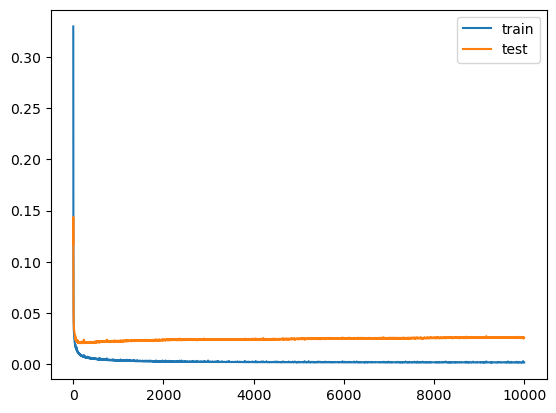

In [11]:
checkpoint = keras.callbacks.ModelCheckpoint('vgg19_dropout_test_models/VGG19_{epoch:05d}.model', period=1000) 
model.compile(optimizer='Adam', loss='mse' , metrics=['accuracy'])
history_vgg19=model.fit(vggfeatures, Y, verbose=1, epochs=10000, validation_split=0.1, batch_size=128, callbacks=[checkpoint])

model.save('VGG19_s2f_10000.model')
plt.plot(history_vgg19.history['loss'], label='train')
plt.plot(history_vgg19.history['val_loss'], label='test')
plt.legend()
plt.show()




Test images:
1/1 [==============================] - 0s 75ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 26ms/step


Train images:
1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step


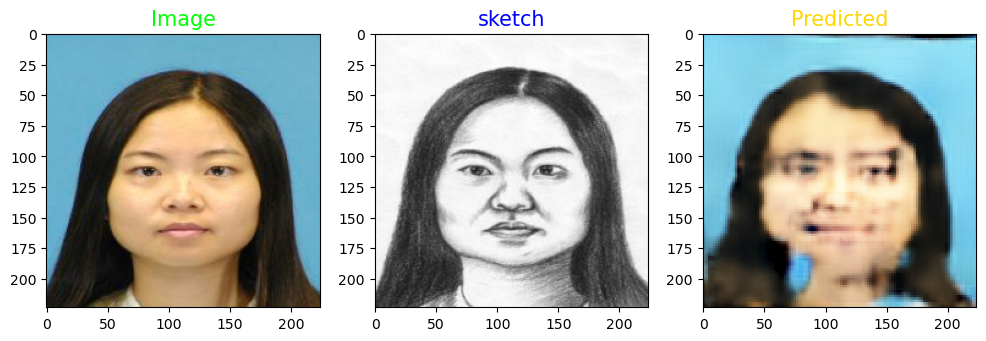

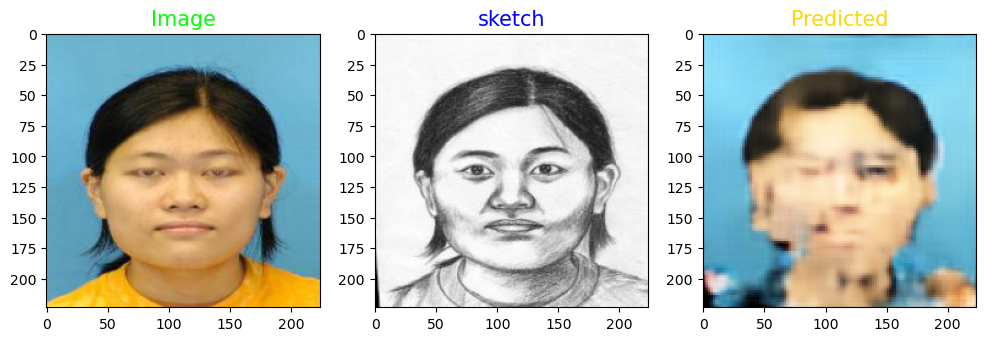

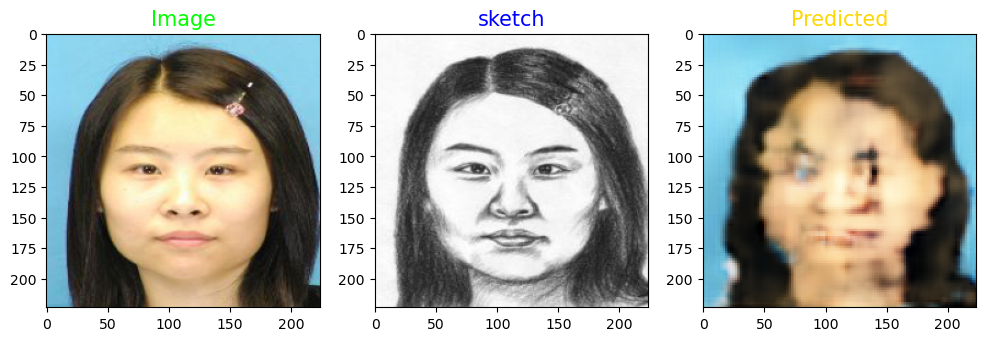

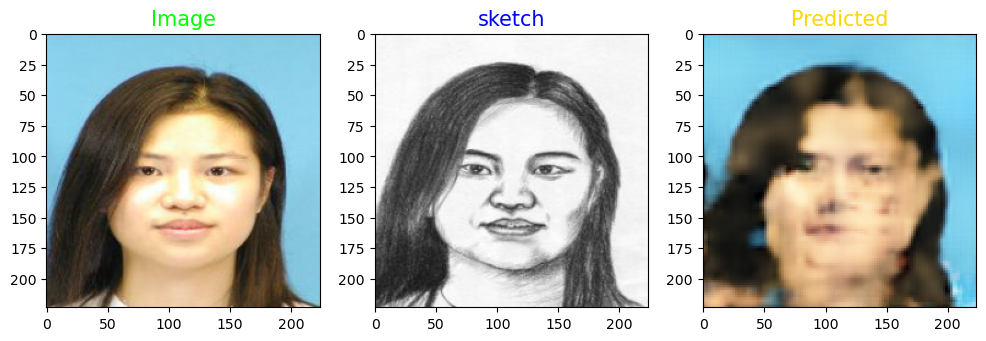

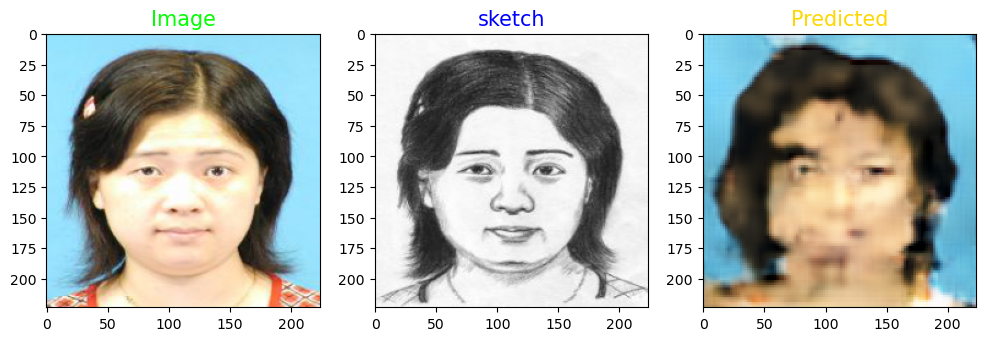

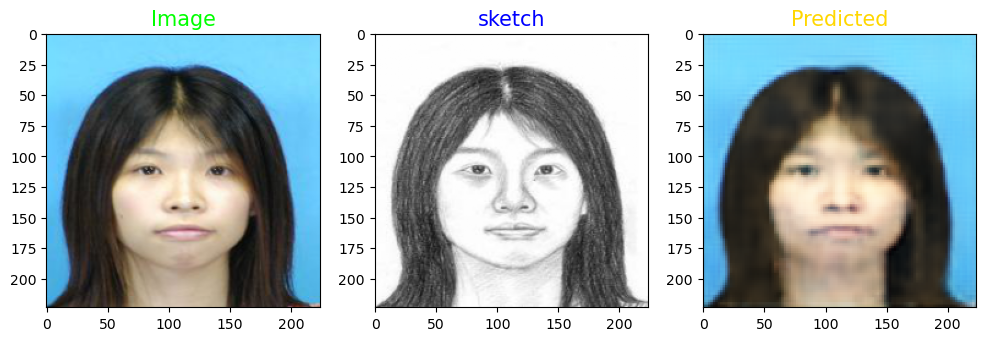

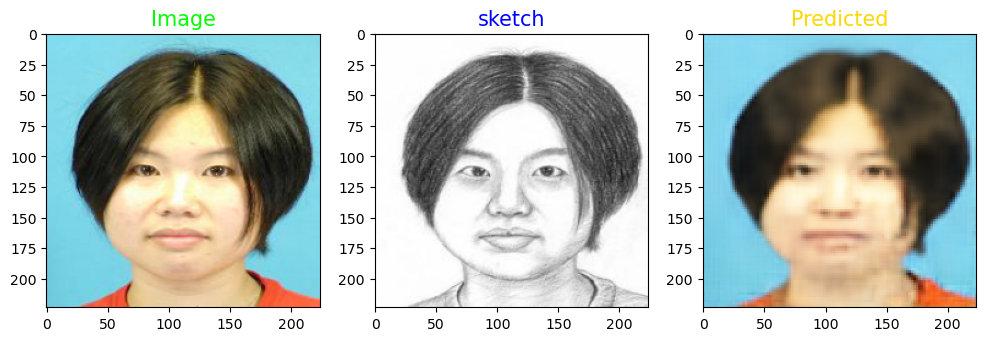

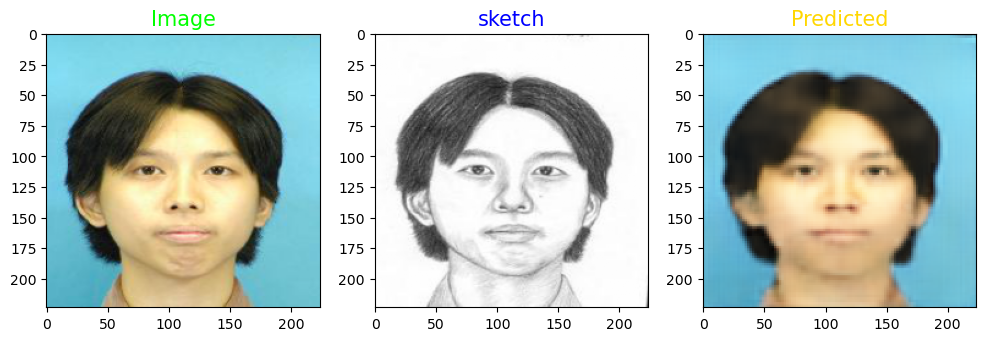

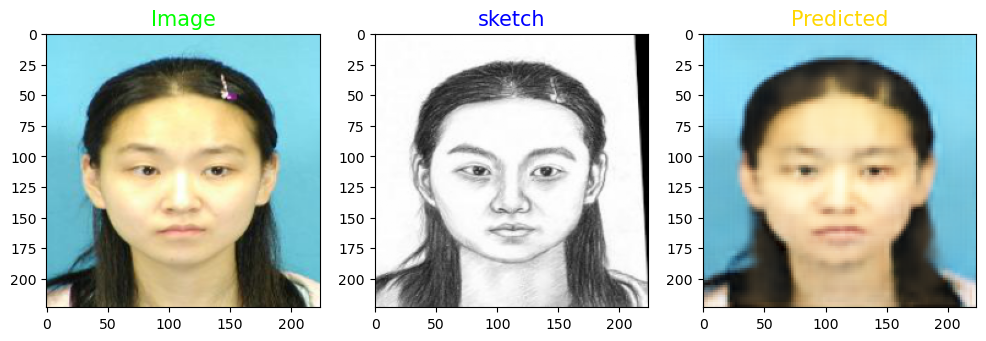

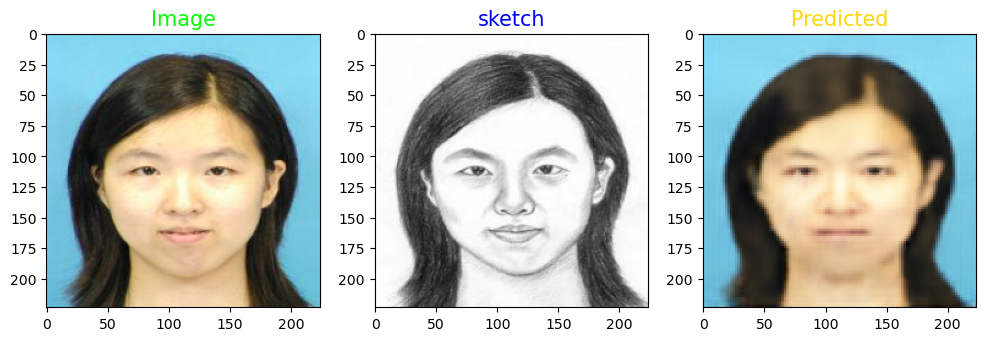

In [12]:
############################################
def show_images(real,sketch, predicted):
    plt.figure(figsize = (12,12))
    plt.subplot(1,3,1)
    plt.title("Image",fontsize = 15, color = 'Lime')
    plt.imshow(real)
    plt.subplot(1,3,2)
    plt.title("sketch",fontsize = 15, color = 'Blue')
    plt.imshow(sketch)
    plt.subplot(1,3,3)
    plt.title("Predicted",fontsize = 15, color = 'gold')
    plt.imshow(predicted)

#Predicting using saved model.
model = tf.keras.models.load_model('VGG19_s2f_10000.model',
                                   custom_objects=None,
                                   compile=True)


print("Test images:")
for i in range(5):
    test_sketch_sample = test_sketch[i].reshape((1,224,224,3))
    vggpred = newmodel.predict(test_sketch_sample)
    sample_pred = model.predict(vggpred).reshape((224,224,3))
    
    show_images(test_image[i],test_sketch[i],sample_pred)
print("Train images:")
for i in range(0,40,8):
    test_sketch_sample = train_sketch[i].reshape((1,224,224,3))
    vggpred = newmodel.predict(test_sketch_sample)
    sample_pred = model.predict(vggpred).reshape((224,224,3))
    
    show_images(train_image[i],train_sketch[i],sample_pred)

In [15]:
#Decoder
from keras.regularizers import l2
model = Sequential()

model.add(Conv2D(256, (3,3), activation='relu', padding='same', activity_regularizer=l2(0.0001), input_shape=(7,7,512)))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
#changed to 3
model.add(Conv2D(3, (3, 3), activation='tanh', padding='same'))
model.add(UpSampling2D((2, 2)))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 7, 7, 256)         1179904   
                                                                 
 conv2d_7 (Conv2D)           (None, 7, 7, 128)         295040    
                                                                 
 up_sampling2d_5 (UpSampling  (None, 14, 14, 128)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 14, 14, 64)        73792     
                                                                 
 up_sampling2d_6 (UpSampling  (None, 28, 28, 64)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 28, 28, 32)       

Epoch 1/1000
5/5 [==============================] - 4s 774ms/step - loss: 0.3538 - accuracy: 0.1790 - val_loss: 0.1574 - val_accuracy: 0.3469
Epoch 2/1000
5/5 [==============================] - 4s 732ms/step - loss: 0.1300 - accuracy: 0.4847 - val_loss: 0.0971 - val_accuracy: 0.4408
Epoch 3/1000
5/5 [==============================] - 4s 721ms/step - loss: 0.0943 - accuracy: 0.3818 - val_loss: 0.0684 - val_accuracy: 0.2198
Epoch 4/1000
5/5 [==============================] - 4s 725ms/step - loss: 0.0720 - accuracy: 0.2124 - val_loss: 0.0615 - val_accuracy: 0.2236
Epoch 5/1000
5/5 [==============================] - 4s 751ms/step - loss: 0.0597 - accuracy: 0.2888 - val_loss: 0.0544 - val_accuracy: 0.3727
Epoch 6/1000
5/5 [==============================] - 4s 733ms/step - loss: 0.0518 - accuracy: 0.3722 - val_loss: 0.0490 - val_accuracy: 0.4052
Epoch 7/1000
5/5 [==============================] - 4s 769ms/step - loss: 0.0463 - accuracy: 0.4989 - val_loss: 0.0462 - val_accuracy: 0.7012
Epoch 

INFO:tensorflow:Assets written to: VGG19_s2f_reg0001_1000.model/assets


INFO:tensorflow:Assets written to: VGG19_s2f_reg0001_1000.model/assets


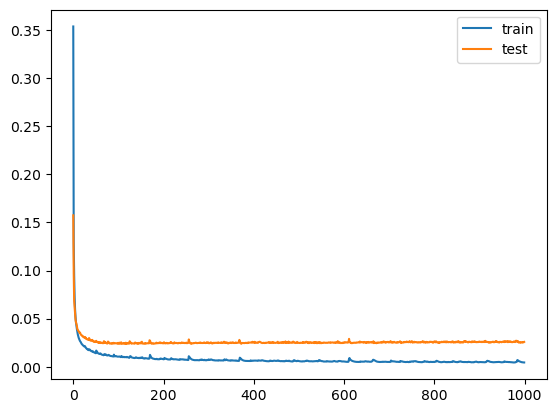

In [16]:
model.compile(optimizer='Adam', loss='mse' , metrics=['accuracy'])
history=model.fit(vggfeatures, Y, verbose=1, epochs=1000, validation_split=0.1, batch_size=128)

model.save('VGG19_s2f_reg0001_1000.model')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

Test images:
1/1 [==============================] - 0s 91ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step
Train images:
1/1 [==============================] - 0s 24ms/step


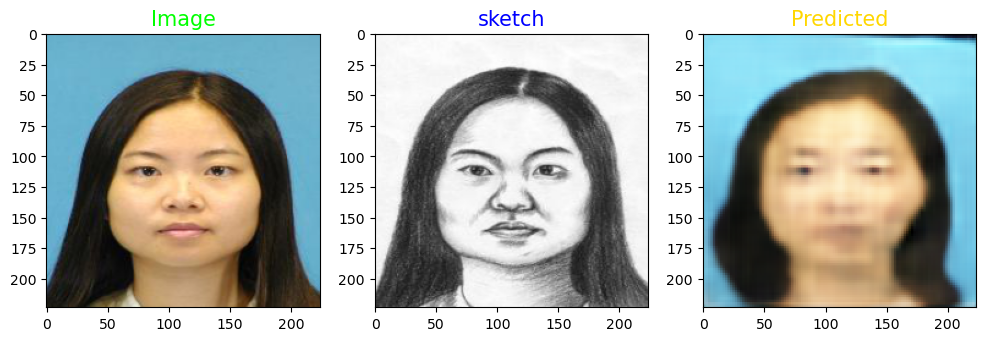

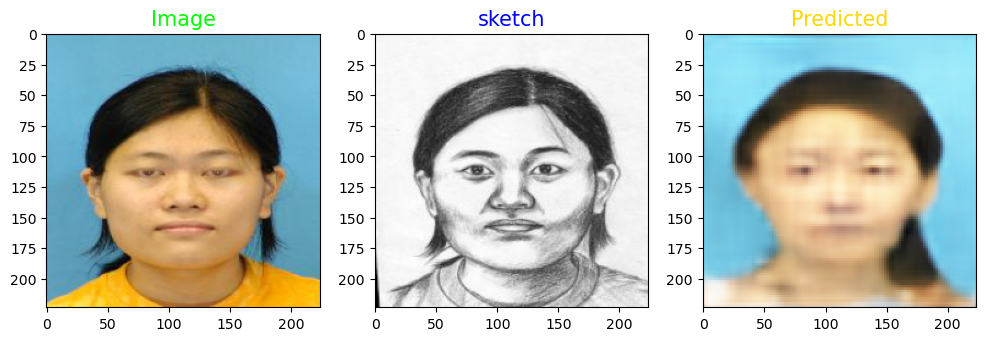

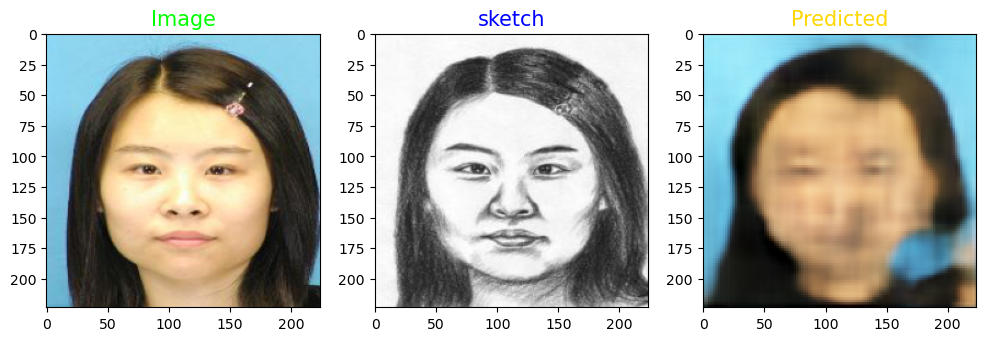

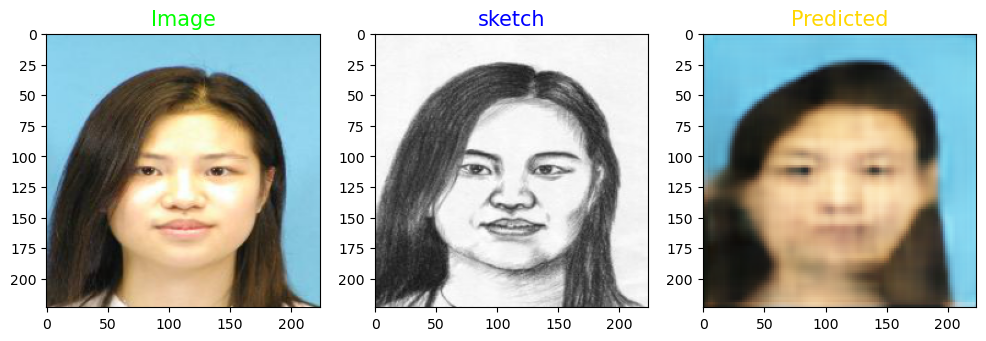

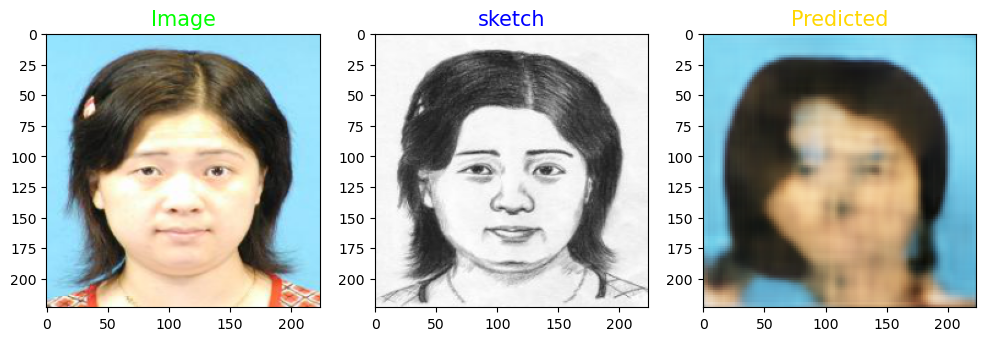

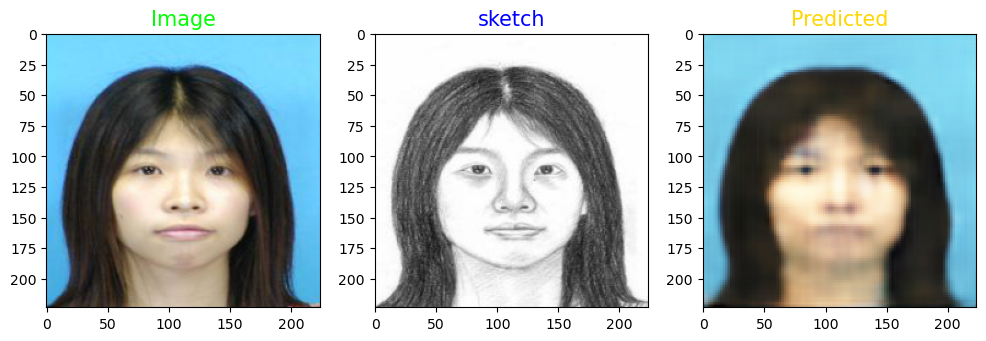

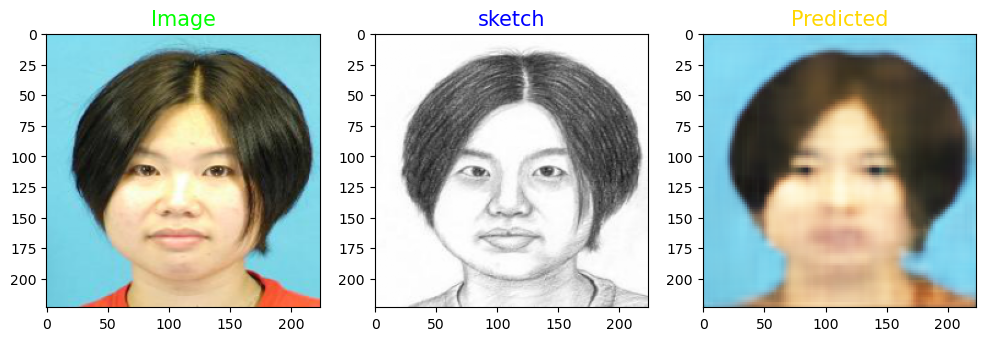

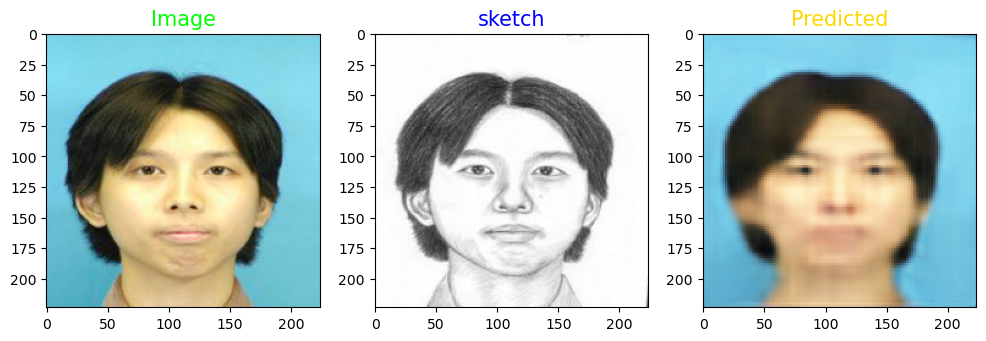

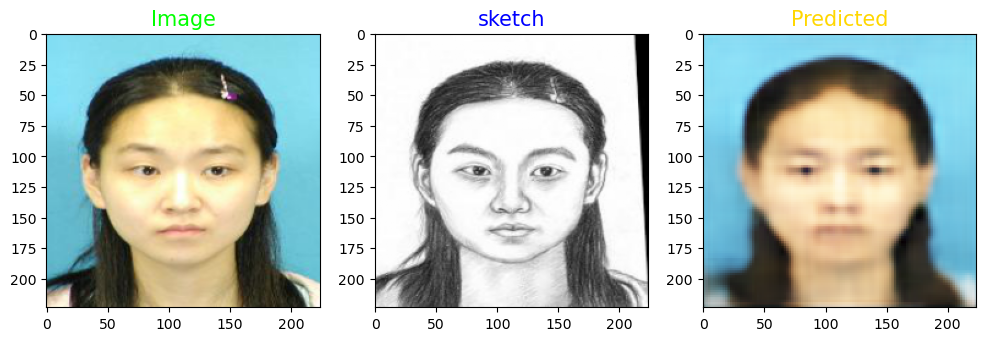

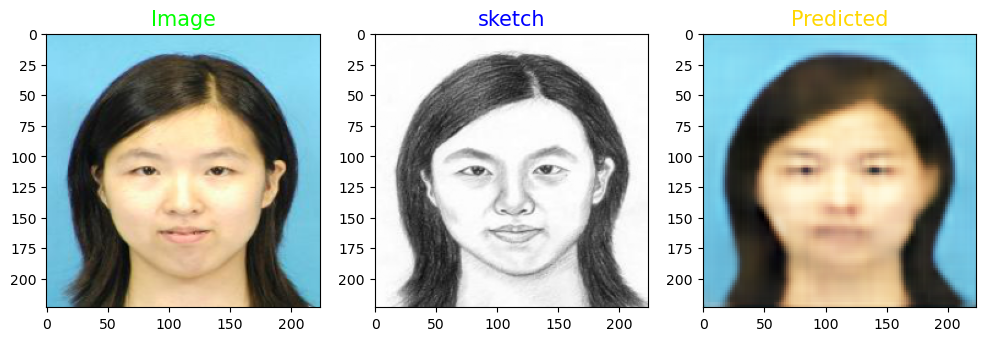

In [17]:
#Predicting using saved model.
model = tf.keras.models.load_model('VGG19_s2f_reg0001_1000.model',
                                   custom_objects=None,
                                   compile=True)


print("Test images:")
for i in range(5):
    test_sketch_sample = test_sketch[i].reshape((1,224,224,3))
    vggpred = newmodel.predict(test_sketch_sample)
    sample_pred = model.predict(vggpred).reshape((224,224,3))
    
    show_images(test_image[i],test_sketch[i],sample_pred)
print("Train images:")
for i in range(0,40,8):
    test_sketch_sample = train_sketch[i].reshape((1,224,224,3))
    vggpred = newmodel.predict(test_sketch_sample)
    sample_pred = model.predict(vggpred).reshape((224,224,3))
    
    show_images(train_image[i],train_sketch[i],sample_pred)

In [29]:
#Decoder
from keras.regularizers import l2
model = Sequential()

model.add(Conv2D(256, (3,3), activation='relu', padding='same', activity_regularizer=l2(0.001), input_shape=(7,7,512)))
model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3,3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
#changed to 3
model.add(Conv2D(3, (3, 3), activation='tanh', padding='same'))
model.add(UpSampling2D((2, 2)))
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 7, 7, 256)         1179904   
                                                                 
 conv2d_43 (Conv2D)          (None, 7, 7, 128)         295040    
                                                                 
 up_sampling2d_35 (UpSamplin  (None, 14, 14, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_44 (Conv2D)          (None, 14, 14, 64)        73792     
                                                                 
 up_sampling2d_36 (UpSamplin  (None, 28, 28, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_45 (Conv2D)          (None, 28, 28, 32)       

Epoch 1/1000
5/5 [==============================] - 4s 757ms/step - loss: 0.1044 - accuracy: 0.0525 - val_loss: 0.0874 - val_accuracy: 0.0580
Epoch 2/1000
5/5 [==============================] - 4s 720ms/step - loss: 0.0910 - accuracy: 0.2661 - val_loss: 0.0798 - val_accuracy: 0.4180
Epoch 3/1000
5/5 [==============================] - 4s 710ms/step - loss: 0.0832 - accuracy: 0.3058 - val_loss: 0.0727 - val_accuracy: 0.0628
Epoch 4/1000
5/5 [==============================] - 4s 717ms/step - loss: 0.0740 - accuracy: 0.0672 - val_loss: 0.0694 - val_accuracy: 0.0498
Epoch 5/1000
5/5 [==============================] - 3s 701ms/step - loss: 0.0662 - accuracy: 0.0703 - val_loss: 0.0638 - val_accuracy: 0.1196
Epoch 6/1000
5/5 [==============================] - 4s 715ms/step - loss: 0.0595 - accuracy: 0.2268 - val_loss: 0.0581 - val_accuracy: 0.4707
Epoch 7/1000
5/5 [==============================] - 3s 707ms/step - loss: 0.0526 - accuracy: 0.5902 - val_loss: 0.0521 - val_accuracy: 0.6853
Epoch 

INFO:tensorflow:Assets written to: VGG19_s2f_reg001_1000.model/assets


INFO:tensorflow:Assets written to: VGG19_s2f_reg001_1000.model/assets


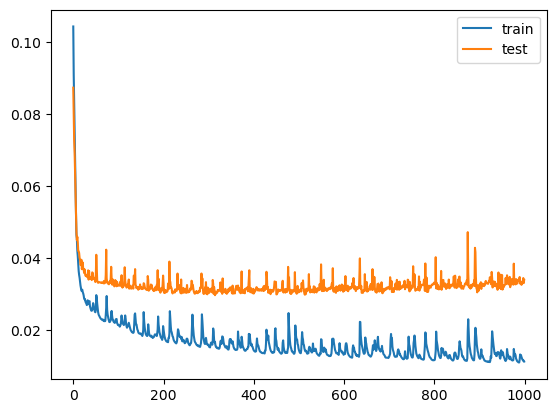

In [31]:
model.compile(optimizer='Adam', loss='mse' , metrics=['accuracy'])
history=model.fit(vggfeatures, Y, verbose=1, epochs=1000, validation_split=0.1, batch_size=128)

model.save('VGG19_s2f_reg001_1000.model')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

Test images:
1/1 [==============================] - 0s 95ms/step


1/1 [==============================] - 0s 44ms/step
Train images:
1/1 [==============================] - 0s 37ms/step


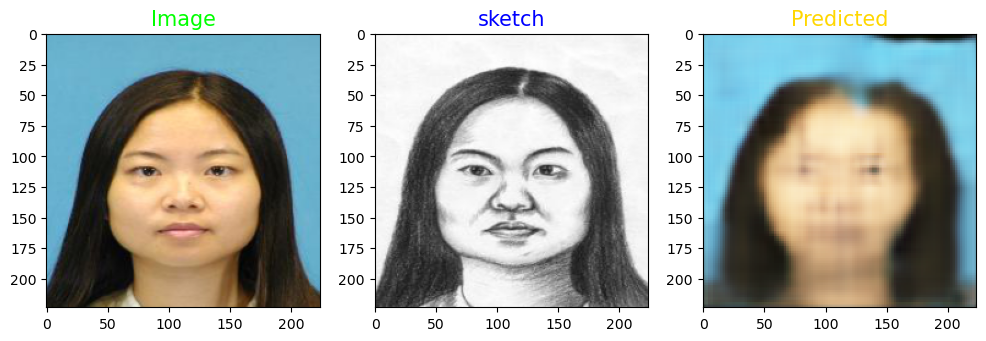

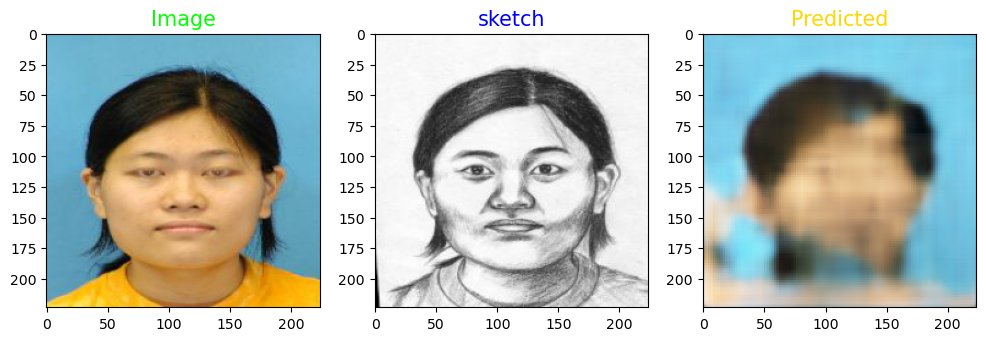

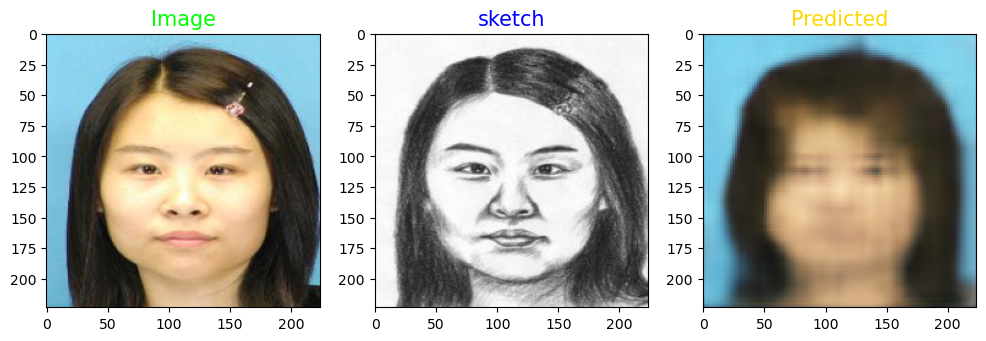

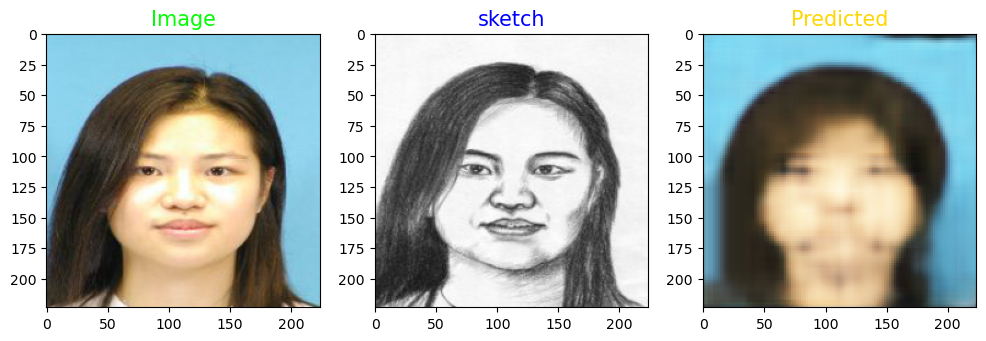

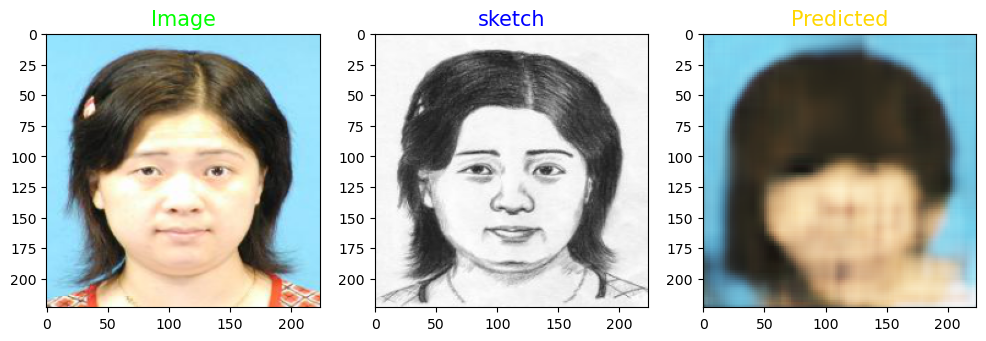

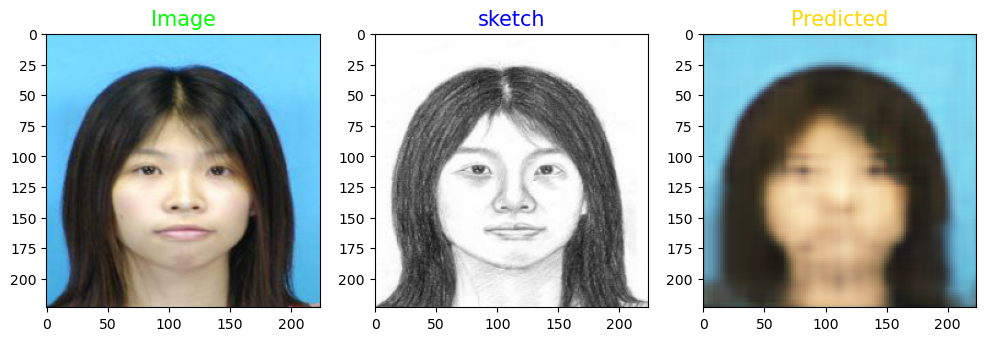

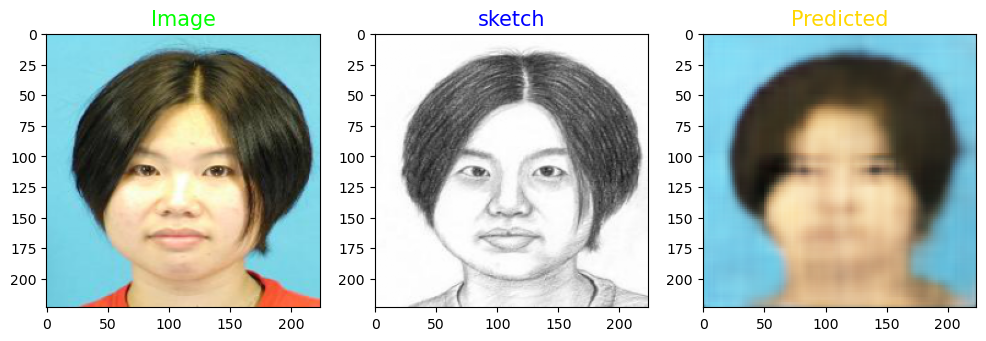

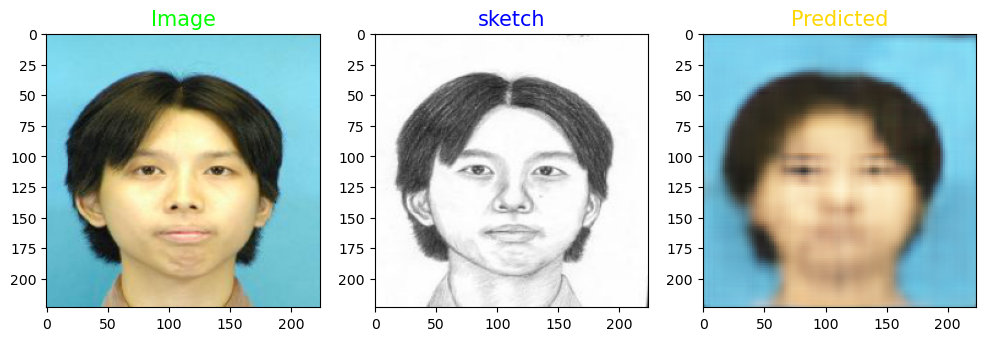

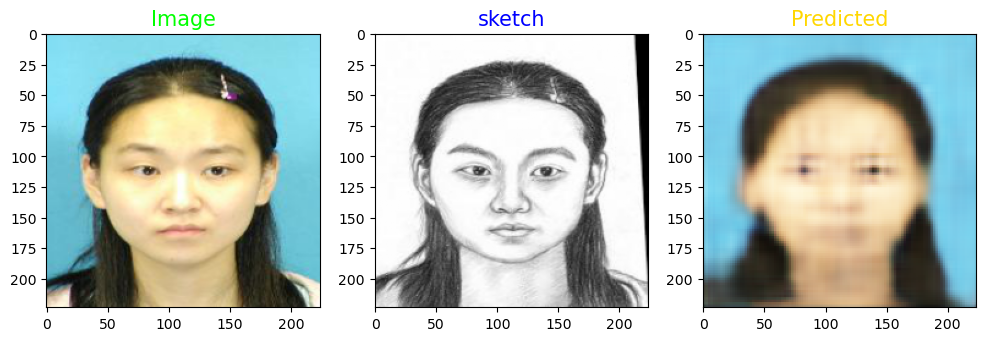

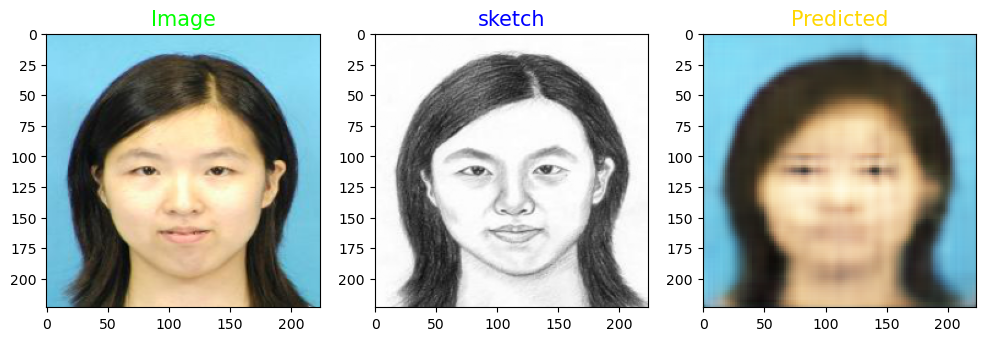

In [42]:
 #Predicting using saved model.
model = tf.keras.models.load_model('VGG19_s2f_reg001_dropout_1000.model',
                                   custom_objects=None,
                                   compile=True)


print("Test images:")
for i in range(5):
    test_sketch_sample = test_sketch[i].reshape((1,224,224,3))
    vggpred = newmodel.predict(test_sketch_sample)
    sample_pred = model.predict(vggpred).reshape((224,224,3))
    
    show_images(test_image[i],test_sketch[i],sample_pred)
print("Train images:")
for i in range(0,40,8):
    test_sketch_sample = train_sketch[i].reshape((1,224,224,3))
    vggpred = newmodel.predict(test_sketch_sample)
    sample_pred = model.predict(vggpred).reshape((224,224,3))
    
    show_images(train_image[i],train_sketch[i],sample_pred)